# Importing Libraries

In [1]:
import torchvision
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor, Normalize, Compose
from torchvision.utils import make_grid, save_image
from tqdm import tqdm
import os

# Mounting drive for Storing training results

In [2]:
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


# Importing Dataset
The dataset that was used for implmentation was MNIST dataset of handwritten digits. Torchvision makes a bunch of popular datasets like MNIST available. To know more click [here](https://pytorch.org/vision/stable/datasets.html)

In [3]:
def binary(x):
    return (x>0.5).float()

transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

dataset = torchvision.datasets.MNIST("/content/",  train=True,transform=transform,download=True)
dataloader= DataLoader(dataset, batch_size=512, shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting /content/MNIST/raw/train-images-idx3-ubyte.gz to /content/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting /content/MNIST/raw/train-labels-idx1-ubyte.gz to /content/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting /content/MNIST/raw/t10k-images-idx3-ubyte.gz to /content/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting /content/MNIST/raw/t10k-labels-idx1-ubyte.gz to /content/MNIST/raw



In [4]:
print(dataset)

Dataset MNIST
    Number of datapoints: 60000
    Root location: /content/
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
           )


5


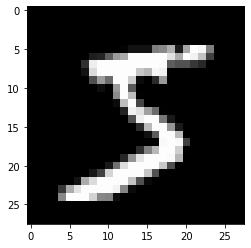

In [5]:
# images in the dataset are of the size (1,28,28)
for x,y in dataset:
  # first dimension needs to be removed in order to display
  plt.imshow(x.squeeze(0), cmap="gray")
  print(y)
  break;

In [40]:
def show_batch(dl):
  '''Used to display a batch of images in the dataset'''
    for images, labels in dl:
        plt.subplots_adjust(left=None, bottom=0, right=None, top=None, wspace=0, hspace=0)
        plt.ioff()
        figs, axs = plt.subplots(1,2,figsize=(14,7))
        for i,ax in enumerate(axs):
          ax.set_xticks([]); ax.set_yticks([])
          if i==0:
            ax.set_title("Original Images")
          else:
            ax.set_title("Generated Images")
          ax.imshow(make_grid(images[:64], nrow=8).permute(1, 2, 0))

        figs.savefig("/content/trial.jpg")
        break

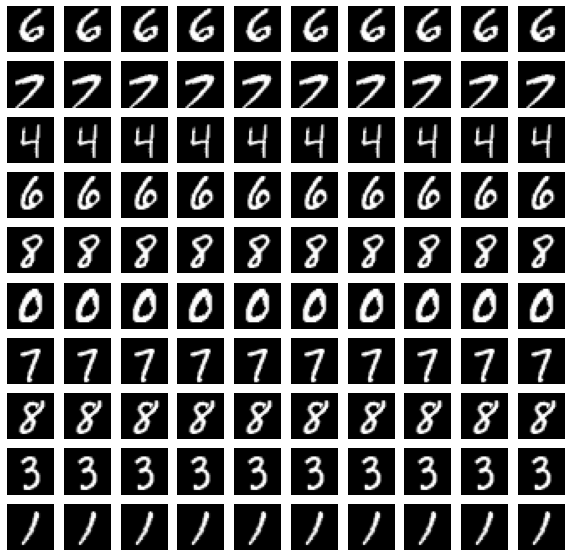

In [6]:
fig, axs = plt.subplots(10,10,figsize=(10,10))
for i, (d,y) in enumerate(dataset):
  for j in range(10):
    axs[i%10,j].imshow(d.squeeze(0), cmap="gray")
    axs[i%10,j].axis('off')
  if i==99:
    break

# Variational Autoencoder Model
Variational Autoencoders have this fundamentally unique property that separates them from vanilla autoencoders is that, their latent space is continuous which makes it easy to randomly sample points and interpolation. It does this by doing something surprising at first: instead of outputting encoding of the input vector, it outputs two vectors of size n, a vector of means $\mathbf{μ}$ and a vector of standard deviations $\mathbf{σ}$.

They form parameters of a vector of random variables $X_i$ which have mean $\mu_i$ and standard deviation $σ_i$, from which we can sample our encoding for the given input. So even if the input is same which results in the same μ and $σ$ vector, the encoding will vary each time due to random sampling. 

Intuitively, mean vector controls where the encoding of an input be centred around while the standard deviation controls the area that how much from the mean, an encoding can vary. The Decoder therefore learns that not only a single point refering to sample of that class but all nearby points refer to the same as well.

In [7]:
class Encoder(nn.Module):

  def __init__(self,input_shape, latent_size):
    super(Encoder,self).__init__()
    c,h,w= input_shape
    self.shape=input_shape
    self.input_channels=c
    self.latent_size=latent_size
    h_new = ((h-8)//2-4)//2
    w_new = ((w-8)//2-4)//2


    self.conv_layers=nn.Sequential(nn.Conv2d(self.input_channels,16,5,padding=0),nn.BatchNorm2d(16),nn.ReLU(inplace=True),
                             nn.Conv2d(16,32,5,padding=0),nn.BatchNorm2d(32),nn.ReLU(inplace=True),
                             nn.MaxPool2d(2,2),
                             nn.Conv2d(32,64,3, padding=0),nn.BatchNorm2d(64),nn.ReLU(inplace=True),
                             nn.Conv2d(64,64,3,padding=0),nn.BatchNorm2d(64),nn.ReLU(inplace=True),
                             nn.MaxPool2d(2,2)
                            #  nn.Conv2d(128,64,3,padding=0),nn.BatchNorm2d(64),nn.ReLU(inplace=True),
                          )
    
    self.linear_layers=nn.Sequential(
                              nn.Linear(h_new*w_new*64,128),nn.BatchNorm1d(128),nn.ReLU(inplace=True),
                              nn.Linear(128,256),nn.BatchNorm1d(256),nn.ReLU(inplace=True)
                            )
    
    # we usually don't directly compute the stddev σ 
    # but the log of the stddev instead, which is log(σ)
    # the reasoning is similar to why we use softmax, instead of directly outputting
    # numbers in fixed range [0, 1], the network can output a wider range of numbers which we can later compress down
    self.linear_means=nn.Sequential(
                              nn.Linear(256,512), nn.BatchNorm1d(512),nn.ReLU(inplace=True),
                              nn.Linear(512,latent_size)
                            )
    self.linear_log_var=nn.Sequential(
                              nn.Linear(256,512), nn.BatchNorm1d(512),nn.ReLU(inplace=True),
                              nn.Linear(512,latent_size)
                            )

  def forward(self,x):
    x=self.conv_layers(x)
    x=x.view(x.shape[0],-1)
    x=self.linear_layers(x)

    means= self.linear_means(x)
    log_var= self.linear_log_var(x)

    return means, log_var




In [8]:
class Decoder(nn.Module):
  def __init__(self, shape, latent_size):
    super(Decoder,self).__init__()  
    c,h,w= shape
    self.shape=shape
    self.decoder = nn.Sequential(
                                  nn.Linear(latent_size,64),nn.BatchNorm1d(64),nn.ReLU(inplace=True),
                                  nn.Linear(64,128),nn.BatchNorm1d(128), nn.ReLU(inplace=True),
                                  nn.Linear(128,256),nn.BatchNorm1d(256),nn.ReLU(inplace=True),
                                  nn.Linear(256,512),nn.BatchNorm1d(512),nn.ReLU(inplace=True),
                                  nn.Linear(512,c*h*w),nn.BatchNorm1d(c*h*w),
                                  nn.Sigmoid()
                                )
    
  def forward(self,x):
    x=self.decoder(x)
    c,h,w=self.shape
    x=x.view(-1,c,h,w)
    return x


In [9]:
class VAE(nn.Module):
  def __init__(self,input_shape,latent_size):
    super(VAE,self).__init__()
    self.shape=input_shape
    self.encoder= Encoder(input_shape,latent_size)
    self.decoder= Decoder(input_shape,latent_size)


  def forward(self,x):
    
    means, log_var =self.encoder(x)
    z = self.reparamatrize(means,log_var)
    x_hat= self.decoder(z)

    return x_hat, means, log_var

  def reparamatrize(self, mean, log_var):
    std= torch.exp(0.5*log_var)
    eps= torch.randn(mean.shape).to(device)

    return mean+eps*std
    

  def inference(self,z):

    recon_x= self.decoder(z)
    return recon_x

# Loss function
Kullback Leibler Divergence between two probability distribution simply measures how they diverge from each other. Minimizing the KL Divergence means optimizing the probability distribution parameters ( $μ$ and $σ$ ) to closely resemble the target distribution.

$$\Sigma_i~ \mu^2_i + \sigma^2_i -\log{σ_i}-1$$

For the VAEs the KL loss is equal to the sum of all KL divergence between the component $X_i \sim \mathcal{N}(μ_i,\sigma_i^2)$ and standard normal distribution.

In [10]:
criterion=nn.BCELoss(reduction='sum')

def reconstruction_loss(X_hat, X):
  global criterion
  loss = criterion(X_hat,X)
  return loss 

def KL_Divergence(mean,log_var):
  KL=-0.5*torch.sum(1+log_var-torch.square(mean)-torch.exp(log_var))
  return KL

def vae_loss(X_hat,X,mean,log_var):
  return reconstruction_loss(X_hat,X)+KL_Divergence(mean,log_var)



In [11]:
for x,y in dataloader:
  print(x.shape)
  print(y)
  break

torch.Size([512, 1, 28, 28])
tensor([5, 9, 2, 3, 4, 1, 7, 9, 3, 6, 0, 7, 3, 0, 4, 7, 9, 9, 0, 8, 3, 1, 7, 7,
        8, 9, 0, 7, 4, 7, 3, 4, 9, 8, 8, 1, 4, 6, 7, 2, 2, 6, 2, 3, 8, 8, 5, 3,
        3, 6, 2, 0, 3, 9, 5, 6, 7, 5, 0, 1, 6, 0, 5, 0, 6, 1, 9, 3, 9, 2, 8, 3,
        0, 3, 6, 5, 3, 3, 0, 4, 1, 7, 5, 0, 1, 7, 1, 7, 3, 0, 8, 1, 6, 0, 3, 1,
        6, 4, 9, 6, 6, 2, 9, 0, 8, 1, 3, 3, 8, 7, 0, 4, 1, 6, 2, 4, 8, 5, 7, 1,
        8, 3, 1, 9, 1, 7, 2, 3, 5, 0, 7, 8, 4, 1, 9, 9, 5, 8, 9, 5, 2, 3, 1, 4,
        2, 3, 9, 5, 7, 6, 8, 8, 3, 1, 4, 5, 7, 1, 2, 8, 9, 3, 5, 5, 7, 2, 3, 5,
        6, 2, 6, 1, 9, 8, 1, 2, 2, 4, 1, 4, 5, 8, 9, 3, 7, 2, 3, 2, 1, 0, 6, 3,
        5, 8, 6, 1, 0, 7, 8, 2, 6, 2, 3, 5, 7, 0, 1, 3, 7, 6, 3, 5, 2, 0, 2, 1,
        5, 2, 4, 7, 4, 0, 5, 5, 4, 2, 2, 2, 9, 1, 0, 5, 5, 9, 1, 8, 2, 0, 8, 1,
        3, 7, 5, 7, 9, 8, 7, 2, 2, 1, 9, 2, 2, 7, 1, 9, 6, 8, 4, 3, 9, 6, 2, 4,
        6, 2, 9, 5, 8, 4, 2, 6, 8, 6, 3, 1, 4, 6, 2, 8, 9, 3, 5, 2, 9, 5, 6, 1,
        1, 

In [12]:
# for training the VAE
device= torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [18]:
# hyperparamters 
learning_rate =0.01
amp= False
epochs =80
save_checkpoint=True
latent_size= 4
input_shape=(1,28,28)
grad_scaler= torch.cuda.amp.GradScaler(enabled=amp)

In [24]:
vae =VAE(input_shape, latent_size).to(device)
vae

VAE(
  (encoder): Encoder(
    (conv_layers): Sequential(
      (0): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1))
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
      (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
      (11): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
      (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (linear_layers): Sequential(


In [25]:
dir_losses="/content/drive/MyDrive/losses_vae/"
dir_results="/content/drive/MyDrive/results_vae/"
dir_checkpoints="/content/drive/MyDrive/checkpoints_vae/"

In [26]:
def adjust_lr(optimizer, decay_rate=0.95):
    for param_group in optimizer.param_groups:
        param_group['lr'] *= decay_rate

# Training Model

  1%|▏         | 1/80 [00:07<09:57,  7.56s/epoch]

Epoch 0/80: iter 117: training loss 950.905039420573
model saved


  2%|▎         | 2/80 [00:14<09:33,  7.35s/epoch]

Epoch 1/80: iter 117: training loss 270.66138587239584


  4%|▍         | 3/80 [00:21<09:17,  7.23s/epoch]

Epoch 2/80: iter 117: training loss 213.5899724283854


  5%|▌         | 4/80 [00:29<09:28,  7.48s/epoch]

Epoch 3/80: iter 117: training loss 186.7912476888021


  6%|▋         | 5/80 [00:36<09:15,  7.41s/epoch]

Epoch 4/80: iter 117: training loss 171.64293173828125


  8%|▊         | 6/80 [00:44<09:12,  7.47s/epoch]

Epoch 5/80: iter 117: training loss 162.03704514973958


  9%|▉         | 7/80 [00:51<09:03,  7.44s/epoch]

Epoch 6/80: iter 117: training loss 154.9548839029948


 10%|█         | 8/80 [00:59<08:47,  7.33s/epoch]

Epoch 7/80: iter 117: training loss 149.67389700520835


 11%|█▏        | 9/80 [01:06<08:34,  7.25s/epoch]

Epoch 8/80: iter 117: training loss 145.75847268880207


 12%|█▎        | 10/80 [01:13<08:26,  7.23s/epoch]

Epoch 9/80: iter 117: training loss 142.82888979492188


 14%|█▍        | 11/80 [01:20<08:16,  7.20s/epoch]

Epoch 10/80: iter 117: training loss 140.21555402018228


 15%|█▌        | 12/80 [01:27<08:13,  7.26s/epoch]

Epoch 11/80: iter 117: training loss 138.16867880859374
Epoch 12/80: iter 117: training loss 136.45354853515624


 18%|█▊        | 14/80 [01:42<07:57,  7.24s/epoch]

Epoch 13/80: iter 117: training loss 134.88640004882814


 19%|█▉        | 15/80 [01:49<07:46,  7.18s/epoch]

Epoch 14/80: iter 117: training loss 133.6921684733073


 20%|██        | 16/80 [01:56<07:38,  7.16s/epoch]

Epoch 15/80: iter 117: training loss 132.51282501627605


 21%|██▏       | 17/80 [02:03<07:29,  7.14s/epoch]

Epoch 16/80: iter 117: training loss 131.60720807291668


 22%|██▎       | 18/80 [02:10<07:23,  7.15s/epoch]

Epoch 17/80: iter 117: training loss 130.90278981119792


 24%|██▍       | 19/80 [02:17<07:15,  7.14s/epoch]

Epoch 18/80: iter 117: training loss 129.934208203125


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
 25%|██▌       | 20/80 [02:25<07:10,  7.17s/epoch]

Epoch 19/80: iter 117: training loss 129.12292145182292


 26%|██▋       | 21/80 [02:32<07:01,  7.14s/epoch]

Epoch 20/80: iter 117: training loss 128.40222591145834
model saved


 28%|██▊       | 22/80 [02:39<06:55,  7.16s/epoch]

Epoch 21/80: iter 117: training loss 127.4377319173177


 29%|██▉       | 23/80 [02:46<06:46,  7.14s/epoch]

Epoch 22/80: iter 117: training loss 127.27850050455729


 30%|███       | 24/80 [02:53<06:37,  7.10s/epoch]

Epoch 23/80: iter 117: training loss 126.47830603841146


 31%|███▏      | 25/80 [03:00<06:30,  7.10s/epoch]

Epoch 24/80: iter 117: training loss 125.86131871744792


 32%|███▎      | 26/80 [03:07<06:24,  7.11s/epoch]

Epoch 25/80: iter 117: training loss 125.6603056640625


 34%|███▍      | 27/80 [03:15<06:20,  7.19s/epoch]

Epoch 26/80: iter 117: training loss 125.01695506184896


 35%|███▌      | 28/80 [03:22<06:12,  7.16s/epoch]

Epoch 27/80: iter 117: training loss 124.58994580078125


 36%|███▋      | 29/80 [03:29<06:04,  7.14s/epoch]

Epoch 28/80: iter 117: training loss 124.5108958984375


 38%|███▊      | 30/80 [03:36<05:57,  7.15s/epoch]

Epoch 29/80: iter 117: training loss 123.77231206054688


 39%|███▉      | 31/80 [03:43<05:52,  7.19s/epoch]

Epoch 30/80: iter 117: training loss 123.50555268554687


 40%|████      | 32/80 [03:51<05:49,  7.27s/epoch]

Epoch 31/80: iter 117: training loss 123.14220227864584


 41%|████▏     | 33/80 [03:58<05:40,  7.24s/epoch]

Epoch 32/80: iter 117: training loss 122.57360628255208


 42%|████▎     | 34/80 [04:05<05:36,  7.31s/epoch]

Epoch 33/80: iter 117: training loss 122.38614007161458


 44%|████▍     | 35/80 [04:13<05:32,  7.40s/epoch]

Epoch 34/80: iter 117: training loss 122.2763713704427


 45%|████▌     | 36/80 [04:21<05:33,  7.59s/epoch]

Epoch 35/80: iter 117: training loss 122.25329326171875


 46%|████▋     | 37/80 [04:28<05:20,  7.45s/epoch]

Epoch 36/80: iter 117: training loss 121.76905022786458


 48%|████▊     | 38/80 [04:35<05:07,  7.33s/epoch]

Epoch 37/80: iter 117: training loss 121.59642163085938


 49%|████▉     | 39/80 [04:42<04:58,  7.27s/epoch]

Epoch 38/80: iter 117: training loss 121.45411824544271


 50%|█████     | 40/80 [04:49<04:49,  7.25s/epoch]

Epoch 39/80: iter 117: training loss 121.0278104654948


 51%|█████▏    | 41/80 [04:57<04:45,  7.31s/epoch]

Epoch 40/80: iter 117: training loss 120.90499334309897
model saved


 52%|█████▎    | 42/80 [05:04<04:38,  7.32s/epoch]

Epoch 41/80: iter 117: training loss 120.64372281901042


 54%|█████▍    | 43/80 [05:11<04:28,  7.26s/epoch]

Epoch 42/80: iter 117: training loss 120.42592814127605


 55%|█████▌    | 44/80 [05:18<04:19,  7.22s/epoch]

Epoch 43/80: iter 117: training loss 120.2399548828125


 56%|█████▋    | 45/80 [05:26<04:12,  7.20s/epoch]

Epoch 44/80: iter 117: training loss 120.0758825358073


 57%|█████▊    | 46/80 [05:33<04:03,  7.16s/epoch]

Epoch 45/80: iter 117: training loss 119.82623837890625


 59%|█████▉    | 47/80 [05:40<03:56,  7.17s/epoch]

Epoch 46/80: iter 117: training loss 119.9936740234375


 60%|██████    | 48/80 [05:47<03:52,  7.27s/epoch]

Epoch 47/80: iter 117: training loss 119.48100550130208


 61%|██████▏   | 49/80 [05:55<03:44,  7.23s/epoch]

Epoch 48/80: iter 117: training loss 119.62612434895833


 62%|██████▎   | 50/80 [06:02<03:37,  7.23s/epoch]

Epoch 49/80: iter 117: training loss 119.25438151041666


 64%|██████▍   | 51/80 [06:09<03:28,  7.21s/epoch]

Epoch 50/80: iter 117: training loss 119.32828531901042


 65%|██████▌   | 52/80 [06:16<03:21,  7.20s/epoch]

Epoch 51/80: iter 117: training loss 118.8538974609375


 66%|██████▋   | 53/80 [06:23<03:13,  7.15s/epoch]

Epoch 52/80: iter 117: training loss 118.82294119466145


 68%|██████▊   | 54/80 [06:30<03:05,  7.14s/epoch]

Epoch 53/80: iter 117: training loss 118.53191520182291


 69%|██████▉   | 55/80 [06:37<02:58,  7.13s/epoch]

Epoch 54/80: iter 117: training loss 118.54183111979167


 70%|███████   | 56/80 [06:45<02:51,  7.13s/epoch]

Epoch 55/80: iter 117: training loss 118.43247356770833


 71%|███████▏  | 57/80 [06:52<02:44,  7.13s/epoch]

Epoch 56/80: iter 117: training loss 118.45586259765625


 72%|███████▎  | 58/80 [06:59<02:38,  7.20s/epoch]

Epoch 57/80: iter 117: training loss 118.21771097005208


 74%|███████▍  | 59/80 [07:06<02:30,  7.16s/epoch]

Epoch 58/80: iter 117: training loss 118.09850862630208


 75%|███████▌  | 60/80 [07:13<02:23,  7.18s/epoch]

Epoch 59/80: iter 117: training loss 118.20001165364583


 76%|███████▋  | 61/80 [07:20<02:16,  7.18s/epoch]

Epoch 60/80: iter 117: training loss 117.93893128255209
model saved


 78%|███████▊  | 62/80 [07:28<02:09,  7.18s/epoch]

Epoch 61/80: iter 117: training loss 117.76179353841145


 79%|███████▉  | 63/80 [07:35<02:02,  7.21s/epoch]

Epoch 62/80: iter 117: training loss 117.56114858398438


 80%|████████  | 64/80 [07:42<01:55,  7.19s/epoch]

Epoch 63/80: iter 117: training loss 117.56956080729167


 81%|████████▏ | 65/80 [07:49<01:47,  7.16s/epoch]

Epoch 64/80: iter 117: training loss 117.36573263346354


 82%|████████▎ | 66/80 [07:56<01:39,  7.12s/epoch]

Epoch 65/80: iter 117: training loss 117.41529658203125


 84%|████████▍ | 67/80 [08:04<01:33,  7.18s/epoch]

Epoch 66/80: iter 117: training loss 117.26056578776041


 85%|████████▌ | 68/80 [08:11<01:25,  7.16s/epoch]

Epoch 67/80: iter 117: training loss 117.11691092122396


 86%|████████▋ | 69/80 [08:18<01:19,  7.25s/epoch]

Epoch 68/80: iter 117: training loss 117.16961604817709


 88%|████████▊ | 70/80 [08:25<01:12,  7.20s/epoch]

Epoch 69/80: iter 117: training loss 117.09555377604167


 89%|████████▉ | 71/80 [08:32<01:04,  7.19s/epoch]

Epoch 70/80: iter 117: training loss 116.80984790039062


 90%|█████████ | 72/80 [08:40<00:57,  7.18s/epoch]

Epoch 71/80: iter 117: training loss 116.97675162760417


 91%|█████████▏| 73/80 [08:47<00:50,  7.16s/epoch]

Epoch 72/80: iter 117: training loss 116.56076860351563


 92%|█████████▎| 74/80 [08:54<00:42,  7.16s/epoch]

Epoch 73/80: iter 117: training loss 116.57708484700521


 94%|█████████▍| 75/80 [09:01<00:35,  7.15s/epoch]

Epoch 74/80: iter 117: training loss 116.58082888997396


 95%|█████████▌| 76/80 [09:08<00:28,  7.24s/epoch]

Epoch 75/80: iter 117: training loss 116.50496282552083


 96%|█████████▋| 77/80 [09:16<00:21,  7.24s/epoch]

Epoch 76/80: iter 117: training loss 116.46099672851562


 98%|█████████▊| 78/80 [09:23<00:14,  7.18s/epoch]

Epoch 77/80: iter 117: training loss 116.58848653971354


 99%|█████████▉| 79/80 [09:30<00:07,  7.17s/epoch]

Epoch 78/80: iter 117: training loss 116.25654497070313


Epoch 79/80: iter 117: training loss 116.14916822916666


<Figure size 432x288 with 0 Axes>

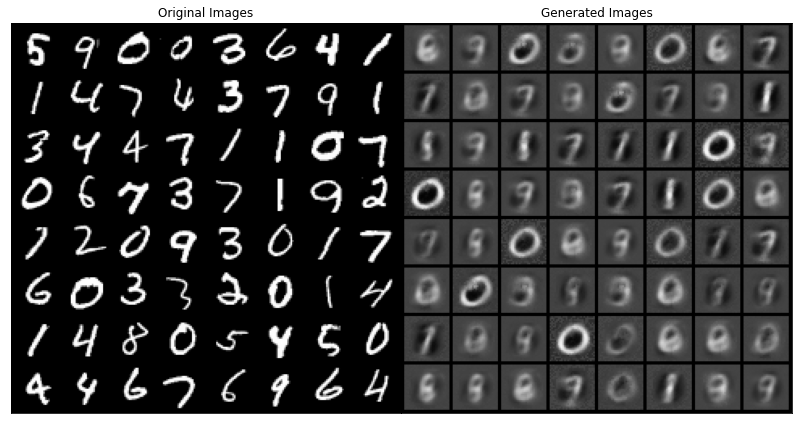

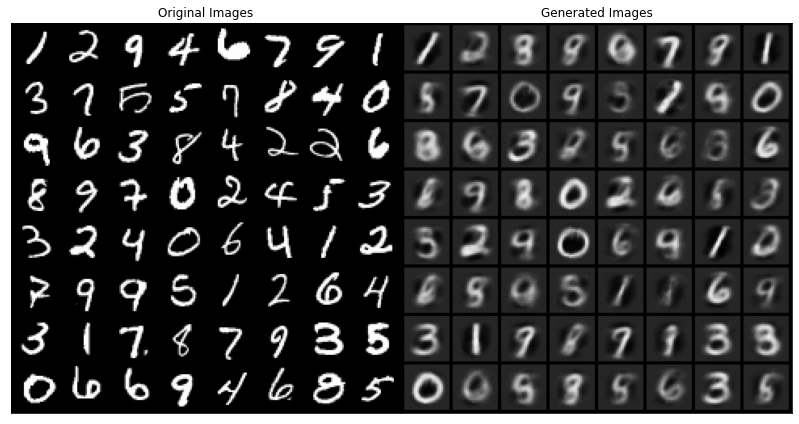

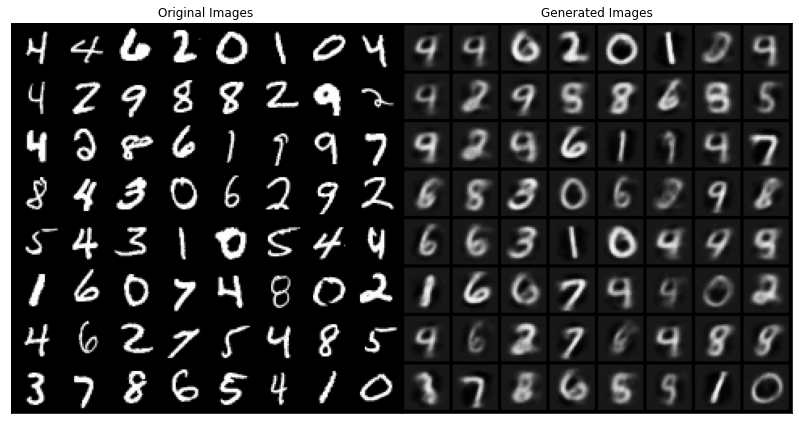

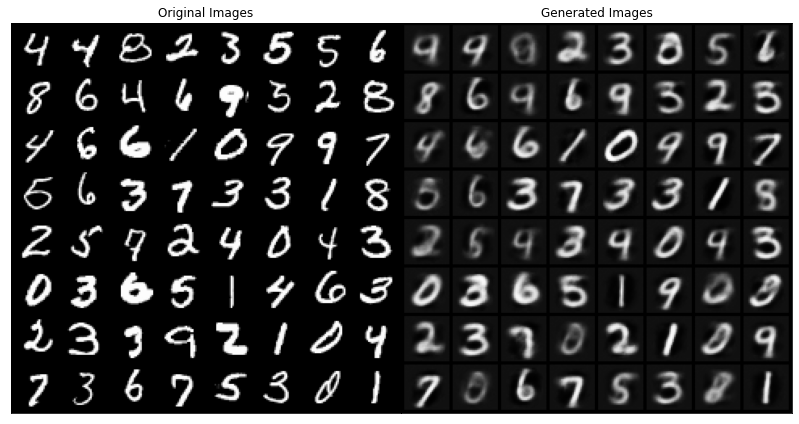

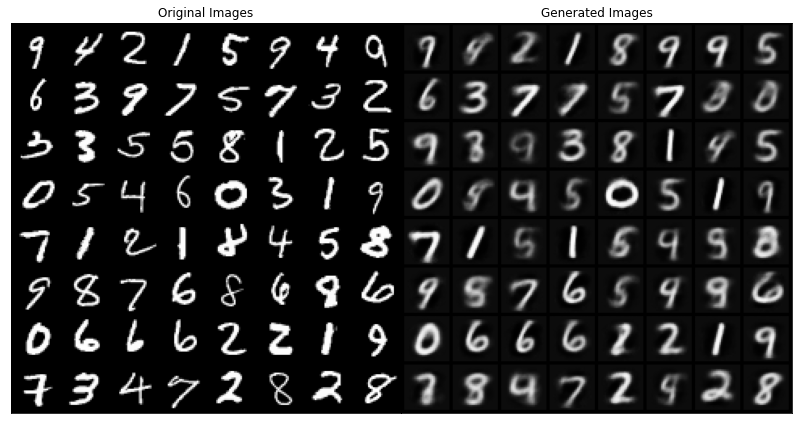

...

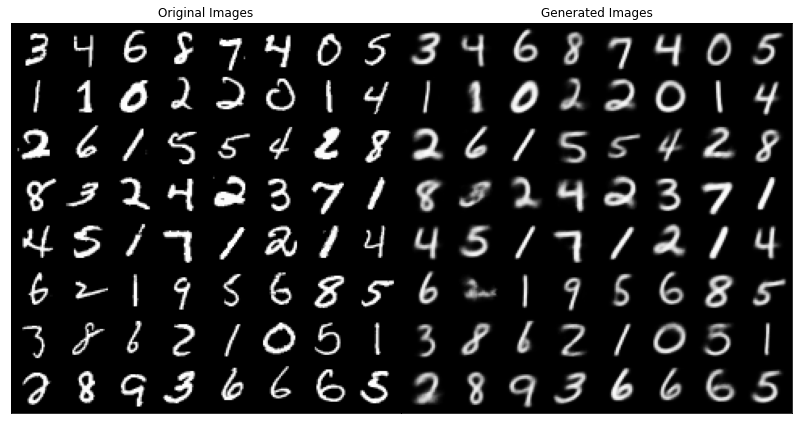

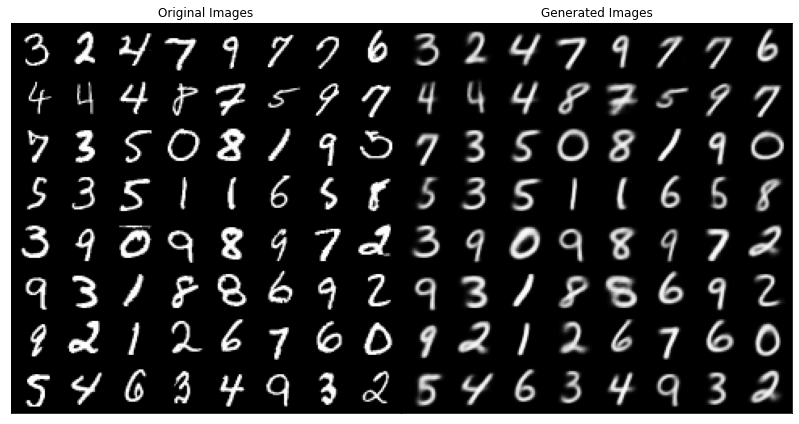

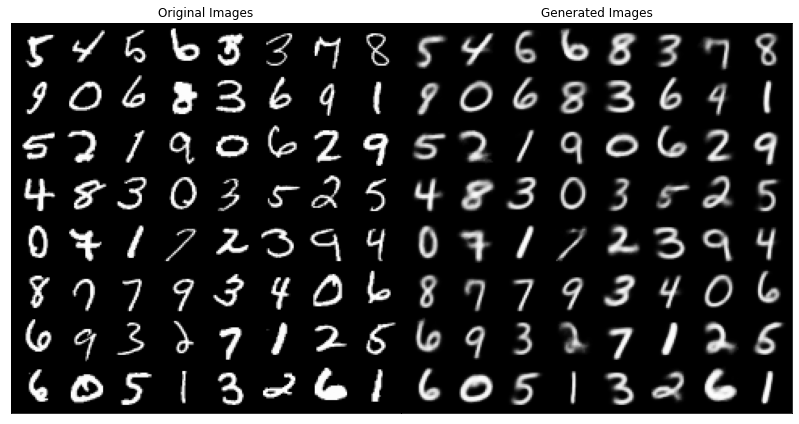

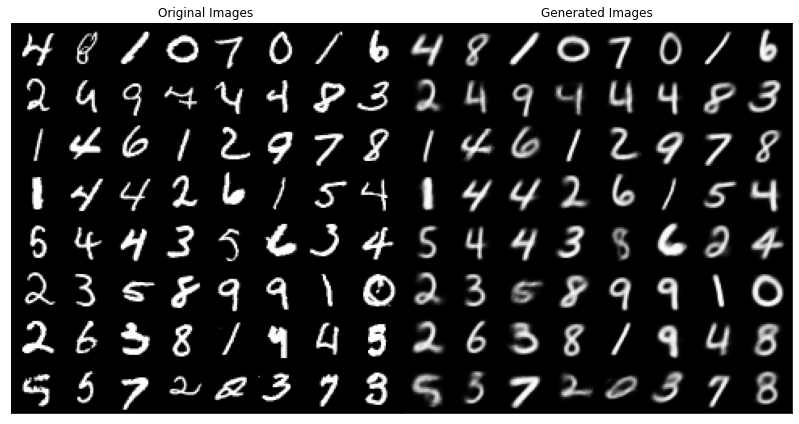

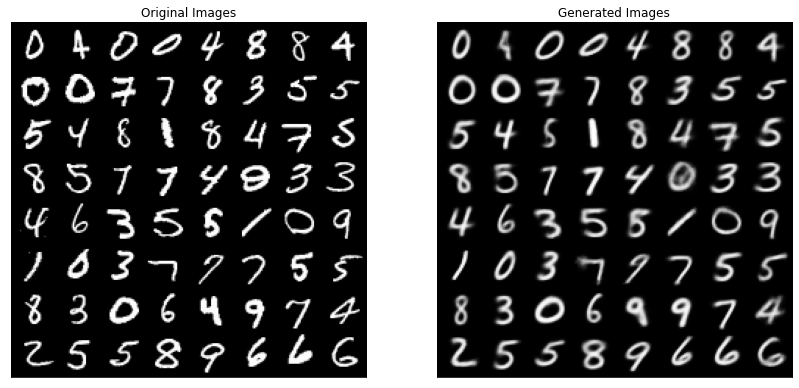

In [27]:
optimizer =torch.optim.Adam(filter(lambda p: p.requires_grad, vae.parameters()),lr=learning_rate, weight_decay=1e-8)

# training the model
for epoch in tqdm(range(epochs), total=80, unit='epoch', leave=False):
  vae.train()
  epoch_loss=0
  n=0
  
  for i, (x,y) in enumerate(dataloader):
    x=x.to(device)

    # with torch.cuda.amp.autocast(enabled=amp):
    recon_x, mean, log_var = vae(x)
    loss = vae_loss(recon_x,x,mean,log_var).to(device)
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    # grad_scaler.scale(loss).backward()
    # grad_scaler.step(optimizer)   
    # grad_scaler.update()

    n+=x.shape[0]
    epoch_loss+=loss.detach().cpu().item()

  epoch_loss/=n
  print(f"Epoch {epoch}/{epochs}: iter {i}: training loss {epoch_loss}")

  if epoch%10==0:
    adjust_lr(optimizer)

  try:
    os.mkdir(dir_losses)
  except Exception as e:
    pass


  with open(dir_losses+"losses_vae.txt",'w' if epoch==0 else 'a') as f:
    f.write(str(epoch_loss)+"\n")


  if save_checkpoint:
    try:
      os.mkdir(dir_results)
    except Exception as e:
      pass
    
    for images, labels in dataloader:
      with torch.no_grad():
        images=images[:64].to(device)
        vae.eval()
        img_hat, mean, log_var= vae(images)
        plt.ioff()
        plt.subplots_adjust(left=None, bottom=0, right=None, top=None, wspace=0, hspace=0)
        figs, axs = plt.subplots(1,2,figsize=(14,7))

        axs[0].set_xticks([]); axs[0].set_yticks([])
        axs[0].set_title("Original Images")
        axs[0].imshow(make_grid(images.detach().cpu(), nrow=8).permute(1, 2, 0))

        axs[1].set_xticks([]); axs[1].set_yticks([])
        axs[1].set_title("Generated Images")
        axs[1].imshow(make_grid(img_hat.detach().cpu(), nrow=8).permute(1, 2, 0))
        
        figs.savefig(dir_results+"result{}.jpg".format(epoch))
        break

    if epoch%20==0:
      try:
        os.mkdir(dir_checkpoints)
      except Exception as e:
        pass
      
      torch.save(vae.state_dict(),dir_checkpoints+"check_epoch_{}.pth".format(epoch))
      print("model saved")

  

In [ ]:
show_batch(dataloader)

In [29]:
epoch_losses=[]
with open(dir_losses+"losses_vae.txt",'r') as f:
  lines= f.readlines()
  for line in lines:
    l=line.strip()
    epoch_losses.append(float(l))
  
print(epoch_losses)

[950.905039420573, 270.66138587239584, 213.5899724283854, 186.7912476888021, 171.64293173828125, 162.03704514973958, 154.9548839029948, 149.67389700520835, 145.75847268880207, 142.82888979492188, 140.21555402018228, 138.16867880859374, 136.45354853515624, 134.88640004882814, 133.6921684733073, 132.51282501627605, 131.60720807291668, 130.90278981119792, 129.934208203125, 129.12292145182292, 128.40222591145834, 127.4377319173177, 127.27850050455729, 126.47830603841146, 125.86131871744792, 125.6603056640625, 125.01695506184896, 124.58994580078125, 124.5108958984375, 123.77231206054688, 123.50555268554687, 123.14220227864584, 122.57360628255208, 122.38614007161458, 122.2763713704427, 122.25329326171875, 121.76905022786458, 121.59642163085938, 121.45411824544271, 121.0278104654948, 120.90499334309897, 120.64372281901042, 120.42592814127605, 120.2399548828125, 120.0758825358073, 119.82623837890625, 119.9936740234375, 119.48100550130208, 119.62612434895833, 119.25438151041666, 119.32828531901

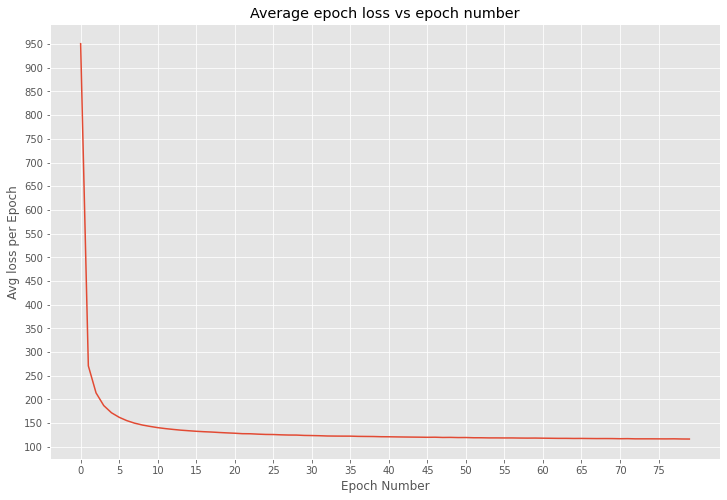

In [38]:
plt.style.use('ggplot')
fig, ax= plt.subplots(figsize=(12,8))
ax.set_xticks(np.arange(0,80,5));ax.set_yticks(np.arange(0,1000,50))
ax.set_title("Average epoch loss vs epoch number")
ax.set_xlabel("Epoch Number")
ax.set_ylabel("Avg loss per Epoch")
ax.plot(epoch_losses)
fig.savefig("epoch_loss.png")

In [39]:
torch.save(vae.state_dict(),dir_checkpoints+"check_epoch_80.pth")